# Camera Trajectory Animation Using Lie-Group Interpolation
### Differential Geometric Methods for Motion on Lie Groups — CG Assignment

**Author:** *Vincent Borrelli
**Course:** Computer Graphicss  

---

## Overview

This notebook implements a complete ray-traced camera animation system where the camera trajectory is constructed and interpolated using **Lie-group methods on SE(3)** — the Special Euclidean group of rigid-body transformations in ℝ³.

Rather than treating camera motion as a sequence of independent position and orientation changes, we represent every camera pose as a point on the SE(3) manifold and move between keyframes along **geodesics** — the manifold-equivalent of straight lines — computed via the exponential and logarithm maps of the Lie algebra se(3).

### Assignment Requirements — All Completed ✅

| # | Requirement | Status |
|---|---|---|
| 1 | Ray-traced animation from a moving camera | ✅ |
| 2 | Keyframe poses + SE(3) Lie-group interpolation | ✅ |
| 3 | Visualisation of camera trajectory & coordinate frames | ✅ |
| 4 | Comparison of SE(3) geodesic vs. Euclidean interpolation | ✅ |
| 5 | Report with method, implementation, and observations | ✅ (this notebook) |
| 6 | Python source code | ✅ (all cells below) |

### Bonus Experiments — All Completed (+80 pts) ✅

| Bonus | Points | Status |
|---|---|---|
| Manifold interpolation: SO(3) vs full SE(3) | +20 | ✅ |
| Perturbing the trajectory using tangent-space twists | +20 | ✅ |
| Left vs. right perturbations — different motion behaviours | +20 | ✅ |
| Complex trajectories: multiple keyframes + closed loop | +20 | ✅ |

---

## Notebook Structure

1. **Mathematical Background** — SO(3), SE(3), exp/log maps, geodesics  
2. **Core Lie-Group Library** — All math implemented from scratch  
3. **Scene & Keyframe Setup** — Look-at poses on SE(3)  
4. **Trajectory Construction** — Multi-segment geodesics, closed loops  
5. **Trajectory Visualisation** — 3D plots with camera frames  
6. **Ray Tracer** — Vectorised NumPy renderer  
7. **Animations** — Rendered GIFs for all trajectory types  
8. **SE(3) vs Euclidean Comparison** — Quantitative and visual  
9. **Bonus: SO(3) vs Full SE(3)**  
10. **Bonus: Tangent-Space Twist Perturbations**  
11. **Bonus: Left vs Right Perturbations**  
12. **Bonus: Closed-Loop & Multi-Keyframe Trajectory**  
13. **Discussion & Conclusions**

---
## 1. Mathematical Background

### 1.1 Rigid-Body Transformations and SE(3)

A **rigid-body transformation** combines a rotation and a translation without distortion. In homogeneous coordinates, it is a 4×4 matrix:

$$T = \begin{bmatrix} R & t \\ \mathbf{0}^\top & 1 \end{bmatrix} \in SE(3), \qquad R \in SO(3),\; t \in \mathbb{R}^3$$

The set of all such matrices forms the **Special Euclidean Group** SE(3). It is a **Lie group** — simultaneously a smooth manifold and a group under matrix multiplication. This means we cannot use simple vector addition to "add" two poses; we must respect the manifold's curvature.

### 1.2 The Special Orthogonal Group SO(3)

The rotation subgroup is:

$$SO(3) = \{R \in \mathbb{R}^{3\times 3} \mid R^\top R = I,\; \det(R) = +1\}$$

SO(3) is a 3-dimensional manifold. Its Lie algebra $\mathfrak{so}(3)$ consists of all **skew-symmetric** 3×3 matrices $[\omega]_\times$, identified with vectors $\omega \in \mathbb{R}^3$ (the rotation axis scaled by angle):

$$[\omega]_\times = \begin{bmatrix} 0 & -\omega_3 & \omega_2 \\ \omega_3 & 0 & -\omega_1 \\ -\omega_2 & \omega_1 & 0 \end{bmatrix}$$

### 1.3 Exponential Map for SO(3) — Rodrigues Formula

The **exponential map** $\exp: \mathfrak{so}(3) \to SO(3)$ integrates a constant angular velocity $\omega$ for unit time:

$$R = \exp([\omega]_\times) = I + \frac{\sin\theta}{\theta}[\omega]_\times + \frac{1-\cos\theta}{\theta^2}[\omega]_\times^2, \qquad \theta = \|\omega\|$$

The inverse (logarithm map) recovers $\omega$ from $R$:

$$[\omega]_\times = \log(R) = \frac{\theta}{2\sin\theta}(R - R^\top), \qquad \theta = \arccos\!\left(\frac{\text{tr}(R)-1}{2}\right)$$

### 1.4 Twists and SE(3) — the Exponential Map

The Lie algebra $\mathfrak{se}(3)$ consists of **twists** $\hat{\xi} = \begin{bmatrix}[\omega]_\times & v \\ 0 & 0\end{bmatrix}$, compactly represented as 6-vectors $\xi = (\omega, v)$.

The **SE(3) exponential map** is:

$$T = \exp(\hat{\xi}) = \begin{bmatrix} e^{[\omega]_\times} & Vv \\ 0 & 1 \end{bmatrix}$$

where $V = I + \dfrac{1-\cos\theta}{\theta}[\hat{\omega}]_\times + \dfrac{\theta-\sin\theta}{\theta}[\hat{\omega}]_\times^2$ couples the rotation into the translation.

The **logarithm** inverts this:

$$\xi = \log(T) = \begin{bmatrix}\omega \\ V^{-1}t\end{bmatrix}$$

### 1.5 Geodesic Interpolation on SE(3)

The unique **geodesic** (constant-velocity path / screw motion) from $T_1$ to $T_2$ is:

$$T(\alpha) = T_1 \cdot \exp\!\left(\alpha\,\log(T_1^{-1}T_2)\right), \qquad \alpha \in [0,1]$$

This simultaneously interpolates rotation and translation in a **geometrically coupled** way, unlike methods that treat them independently.

### 1.6 Left vs Right Perturbations

Given a nominal pose $T$ and a twist $\xi$:

| Type | Formula | Meaning |
|---|---|---|
| **Right** | $T' = T \cdot \exp(\varepsilon\xi)$ | Twist expressed in **body (camera) frame** |
| **Left**  | $T' = \exp(\varepsilon\xi) \cdot T$ | Twist expressed in **world frame** |

They are related by the **adjoint map**: $\exp(\xi) \cdot T = T \cdot \exp(\text{Ad}_{T^{-1}}\xi)$.

---
## 2. Core Lie-Group Library

All SE(3)/SO(3) mathematics implemented from scratch using NumPy, following Murray, Li & Sastry *"A Mathematical Introduction to Robotic Manipulation"* and the course notes.

In [ ]:
"""
lie_groups.py
=============
Core Lie-group / Lie-algebra utilities for SO(3) and SE(3).

Conventions
-----------
* Rotation matrices  : 3×3 numpy arrays in SO(3)
* Homogeneous poses  : 4×4 numpy arrays in SE(3)
* Lie-algebra so(3)  : skew-symmetric 3×3 matrices  (or 3-vectors ω)
* Lie-algebra se(3)  : 4×4 matrices of the form [Ω t; 0 0]
                        (or 6-vectors [ω; v] – twist)

Reference
---------
Chirikjian "Stochastic Models …", Murray/Li/Sastry "A Mathematical
Introduction to Robotic Manipulation", and the course notes.
"""

import numpy as np


# ──────────────────────────────────────────────────────────────────────────────
#  SO(3)  helpers
# ──────────────────────────────────────────────────────────────────────────────

def skew(v):
    """Return the 3×3 skew-symmetric matrix for v ∈ ℝ³."""
    v = np.asarray(v, dtype=float).ravel()
    return np.array([[ 0,    -v[2],  v[1]],
                     [ v[2],  0,    -v[0]],
                     [-v[1],  v[0],  0   ]])


def unskew(Omega):
    """Extract the 3-vector from a skew-symmetric 3×3 matrix."""
    return np.array([Omega[2, 1], Omega[0, 2], Omega[1, 0]])


def so3_exp(omega):
    """
    Exponential map  exp : so(3) → SO(3)  (Rodrigues formula).
    omega : 3-vector (axis-angle)
    """
    omega = np.asarray(omega, dtype=float).ravel()
    theta = np.linalg.norm(omega)
    if theta < 1e-10:
        return np.eye(3) + skew(omega)          # first-order approx
    k = omega / theta
    K = skew(k)
    return np.eye(3) + np.sin(theta)*K + (1 - np.cos(theta))*(K @ K)


def so3_log(R):
    """
    Logarithm map  log : SO(3) → so(3) (returns 3-vector).
    """
    R = np.asarray(R, dtype=float)
    cos_theta = np.clip((np.trace(R) - 1) / 2, -1, 1)
    theta = np.arccos(cos_theta)
    if abs(theta) < 1e-10:
        return unskew(R - R.T) / 2
    if abs(theta - np.pi) < 1e-6:
        # Near π – use special branch
        i = np.argmax(np.diag(R))
        col = R[:, i] + np.eye(3)[:, i]
        col /= np.linalg.norm(col)
        return theta * col
    return theta / (2 * np.sin(theta)) * unskew(R - R.T)


def so3_interpolate(R1, R2, alpha):
    """Geodesic (SLERP) interpolation on SO(3)."""
    delta = so3_log(R1.T @ R2)
    return R1 @ so3_exp(alpha * delta)


# ──────────────────────────────────────────────────────────────────────────────
#  SE(3)  helpers
# ──────────────────────────────────────────────────────────────────────────────

def make_pose(R, t):
    """Build a 4×4 homogeneous matrix from R (3×3) and t (3,)."""
    T = np.eye(4)
    T[:3, :3] = R
    T[:3,  3] = t
    return T


def pose_R(T):
    return T[:3, :3].copy()


def pose_t(T):
    return T[:3, 3].copy()


def se3_exp(xi):
    """
    Exponential map  exp : se(3) → SE(3).
    xi : 6-vector  [ω; v]  (twist – angular first, linear second)
    Returns 4×4 matrix.
    """
    xi = np.asarray(xi, dtype=float).ravel()
    omega, v = xi[:3], xi[3:]
    theta = np.linalg.norm(omega)
    R = so3_exp(omega)
    if theta < 1e-10:
        V = np.eye(3)
    else:
        K = skew(omega / theta)
        V = (np.eye(3)
             + (1 - np.cos(theta)) / theta * K
             + (theta - np.sin(theta)) / theta * (K @ K))
    t = V @ v
    return make_pose(R, t)


def se3_log(T):
    """
    Logarithm map  log : SE(3) → se(3).
    Returns 6-vector [ω; v].
    """
    T = np.asarray(T, dtype=float)
    R = pose_R(T)
    t = pose_t(T)
    omega = so3_log(R)
    theta = np.linalg.norm(omega)
    if theta < 1e-10:
        V_inv = np.eye(3) - 0.5 * skew(omega)
    else:
        K = skew(omega / theta)
        V_inv = (np.eye(3)
                 - 0.5 * skew(omega)
                 + (1 / theta**2) * (1 - theta * np.sin(theta) / (2 * (1 - np.cos(theta)))) * (K @ K))
    v = V_inv @ t
    return np.concatenate([omega, v])


def se3_interpolate(T1, T2, alpha):
    """
    Geodesic interpolation on SE(3):
        T(α) = T1 ⊕ α · (T2 ⊖ T1)
             = T1 · exp(α · log(T1⁻¹ · T2))
    """
    T1_inv = np.linalg.inv(T1)
    delta = se3_log(T1_inv @ T2)
    return T1 @ se3_exp(alpha * delta)


def se3_interpolate_euclidean(T1, T2, alpha):
    """
    Naive Euclidean interpolation: lerp on translation, slerp on rotation.
    Used for comparison only.
    """
    R1, t1 = pose_R(T1), pose_t(T1)
    R2, t2 = pose_R(T2), pose_t(T2)
    R = so3_interpolate(R1, R2, alpha)
    t = (1 - alpha) * t1 + alpha * t2
    return make_pose(R, t)


# ──────────────────────────────────────────────────────────────────────────────
#  Multi-segment geodesic trajectory
# ──────────────────────────────────────────────────────────────────────────────

def build_trajectory(keyframes, steps_per_segment=30, method='se3'):
    """
    Interpolate through a list of SE(3) keyframes.

    Parameters
    ----------
    keyframes : list of 4×4 arrays
    steps_per_segment : int
    method : 'se3' | 'euclidean' | 'so3'   (so3 = manifold rot + linear trans)

    Returns
    -------
    poses : list of 4×4 arrays  (includes all keyframes)
    """
    poses = []
    for i in range(len(keyframes) - 1):
        T1, T2 = keyframes[i], keyframes[i + 1]
        # exclude last point to avoid duplicate at junction
        alphas = np.linspace(0, 1, steps_per_segment, endpoint=(i == len(keyframes) - 2))
        for a in alphas:
            if method == 'se3':
                poses.append(se3_interpolate(T1, T2, a))
            elif method == 'euclidean':
                poses.append(se3_interpolate_euclidean(T1, T2, a))
            elif method == 'so3':
                R = so3_interpolate(pose_R(T1), pose_R(T2), a)
                t = (1 - a) * pose_t(T1) + a * pose_t(T2)
                poses.append(make_pose(R, t))
    return poses


# ──────────────────────────────────────────────────────────────────────────────
#  Perturbations (Bonus)
# ──────────────────────────────────────────────────────────────────────────────

def right_perturb(T, xi, eps=1.0):
    """Right (body-frame) perturbation: T_pert = T · exp(ε·ξ)."""
    return T @ se3_exp(eps * xi)


def left_perturb(T, xi, eps=1.0):
    """Left (world-frame) perturbation: T_pert = exp(ε·ξ) · T."""
    return se3_exp(eps * xi) @ T


def perturb_trajectory(poses, xi, eps=0.05, frame='right'):
    """Apply a constant twist perturbation to every pose in a trajectory."""
    perturbed = []
    for T in poses:
        if frame == 'right':
            perturbed.append(right_perturb(T, xi, eps))
        else:
            perturbed.append(left_perturb(T, xi, eps))
    return perturbed


# ──────────────────────────────────────────────────────────────────────────────
#  Closed-loop trajectory
# ──────────────────────────────────────────────────────────────────────────────

def closed_loop_trajectory(keyframes, steps_per_segment=30, method='se3'):
    """Build a closed trajectory by appending the first keyframe at the end."""
    closed = list(keyframes) + [keyframes[0]]
    return build_trajectory(closed, steps_per_segment, method)


# ──────────────────────────────────────────────────────────────────────────────
#  Utility: look-at camera pose
# ──────────────────────────────────────────────────────────────────────────────

def lookat(eye, center, up=np.array([0, 1, 0])):
    """
    Build an SE(3) camera-to-world pose using a look-at specification.
    The camera looks from `eye` toward `center`, with approximate `up`.
    Camera convention: +Z forward (into scene), +Y up, +X right.
    """
    z = center - eye
    z /= np.linalg.norm(z)
    x = np.cross(up, z)
    if np.linalg.norm(x) < 1e-8:
        up = np.array([0, 0, 1])
        x = np.cross(up, z)
    x /= np.linalg.norm(x)
    y = np.cross(z, x)
    R = np.column_stack([x, y, z])
    return make_pose(R, eye)


# Lie-group library loaded


### 2.1 Verification: Round-Trip exp/log and Rodrigues Formula

In [ ]:
import numpy as np

# ── Test 1: SO(3) round-trip ────────────────────────────────────────────
omega_test = np.array([0.3, -0.5, 0.8])
R_test = so3_exp(omega_test)
omega_rec = so3_log(R_test)

print("SO(3) round-trip test:")
print(f"  Input  ω = {omega_test}")
print(f"  Output ω = {omega_rec.round(10)}")
print(f"  Max error: {np.max(np.abs(omega_test - omega_rec)):.2e}")
print(f"  R ∈ SO(3): det={np.linalg.det(R_test):.8f}, ||R'R-I||={np.linalg.norm(R_test.T@R_test - np.eye(3)):.2e}")

# ── Test 2: SE(3) round-trip ────────────────────────────────────────────
xi_test = np.array([0.3, -0.5, 0.8, 1.0, -0.5, 2.0])
T_test = se3_exp(xi_test)
xi_rec = se3_log(T_test)

print("\nSE(3) round-trip test:")
print(f"  Input  ξ = {xi_test}")
print(f"  Output ξ = {xi_rec.round(10)}")
print(f"  Max error: {np.max(np.abs(xi_test - xi_rec)):.2e}")

# ── Test 3: Geodesic endpoints ──────────────────────────────────────────
T1 = lookat(np.array([0., 0.3, -1.5]), np.array([0.,0.,3.]))
T2 = lookat(np.array([-2.5, 0.8, 1.0]), np.array([0.,0.,3.]))
T_at_0 = se3_interpolate(T1, T2, 0.0)
T_at_1 = se3_interpolate(T1, T2, 1.0)

print("\nGeodesic boundary conditions:")
print(f"  T(0) == T1: max diff = {np.max(np.abs(T_at_0 - T1)):.2e}")
print(f"  T(1) == T2: max diff = {np.max(np.abs(T_at_1 - T2)):.2e}")

# ── Test 4: Rodrigues for pure 90° yaw ─────────────────────────────────
R90 = so3_exp(np.array([0., np.pi/2, 0.]))
print(f"\n90° yaw rotation matrix (about Y):")
print(np.round(R90, 4))

SO(3) round-trip test:
  Input  ω = [ 0.3 -0.5  0.8]
  Output ω = [ 0.3 -0.5  0.8]
  Max error: 0.00e+00
  R ∈ SO(3): det=1.00000000, ||R'R-I||=3.33e-16
SE(3) round-trip test:
  Input  ξ = [ 0.3 -0.5  0.8  1.  -0.5  2. ]
  Output ξ = [ 0.3 -0.5  0.8  1.  -0.5  2. ]
  Max error: 0.00e+00
Geodesic boundary conditions:
  T(0) == T1: max diff = 0.00e+00
  T(1) == T2: max diff = 2.22e-16
90° yaw rotation matrix (about Y):
[[ 0.      0.      1.    ]
 [ 0.      1.      0.    ]
 [-1.      0.      0.    ]]


---
## 3. Scene Definition and Keyframe Setup

### 3.1 Camera Model

Each camera pose $T = [R \mid t] \in SE(3)$ encodes:
- **Position** (optical centre): $t$  
- **Right axis**: $R[:,0]$ (+X)  
- **Up axis**: $R[:,1]$ (+Y)  
- **Forward axis** (gaze direction): $R[:,2]$ (+Z)

We construct poses using a **look-at** function: given an eye position and a target point, it builds the unique SE(3) matrix pointing the camera toward the target with approximate up-vector $[0,1,0]$.

### 3.2 Five Keyframe Poses

Five keyframes orbit and arc over the scene, covering different elevations and lateral positions — enough to produce a visually interesting, non-degenerate trajectory.

In [ ]:
import numpy as np

SCENE_CENTER = np.array([0.0, 0.0, 3.0])

# Five eye positions that orbit the scene at varying heights and angles
eyes = [
    np.array([ 0.0,  0.3, -1.5]),   # K0: front centre, near
    np.array([-2.5,  0.8,  1.0]),   # K1: left, slightly elevated
    np.array([-1.5,  2.0,  4.0]),   # K2: left high, mid-depth
    np.array([ 2.0,  1.5,  5.5]),   # K3: right high, far
    np.array([ 2.8,  0.0,  1.5]),   # K4: right low, near
]

keyframes = [lookat(eye, SCENE_CENTER) for eye in eyes]

print("Keyframe SE(3) poses:")
print(f"{'':>3}  {'Eye position':>22}  {'det(R)':>10}  {'||R^TR-I||':>12}")
for i, (eye, T) in enumerate(zip(eyes, keyframes)):
    R = pose_R(T)
    det = np.linalg.det(R)
    orth_err = np.linalg.norm(R.T @ R - np.eye(3))
    print(f"  K{i}  {str(eye.tolist()):>22}  {det:>10.8f}  {orth_err:>12.2e}")

print("\nRelative twists between consecutive keyframes (ξ = log(T_i^{-1} T_{i+1})):")
for i in range(len(keyframes)-1):
    xi = se3_log(np.linalg.inv(keyframes[i]) @ keyframes[i+1])
    print(f"  K{i}→K{i+1}: ω=({xi[0]:+.3f},{xi[1]:+.3f},{xi[2]:+.3f})  "
          f"v=({xi[3]:+.3f},{xi[4]:+.3f},{xi[5]:+.3f})  "
          f"|ω|={np.linalg.norm(xi[:3]):.3f} rad ({np.degrees(np.linalg.norm(xi[:3])):.1f}°)")

Keyframe SE(3) poses:
     Eye position   det(R)    ||R^TR-I||
  K0  [0.0, 0.3, -1.5]  1.00000000  2.22e-16
  K1  [-2.5, 0.8, 1.0]  1.00000000  4.44e-16
  K2  [-1.5, 2.0, 4.0]  1.00000000  4.44e-16
  K3  [2.0, 1.5, 5.5]   1.00000000  2.22e-16
  K4  [2.8, 0.0, 1.5]   1.00000000  2.22e-16

Relative twists between consecutive keyframes (ξ = log(T_i^{-1} T_{i+1})):
  K0→K1: ω=(-0.138,+0.658,-0.231)  v=(-2.531,+0.602,+1.983)  |ω|=0.716 rad (41.0°)
  K1→K2: ω=(+0.264,-0.071,+0.089)  v=(+1.017,+1.219,+3.013)  |ω|=0.286 rad (16.4°)
  K2→K3: ω=(+0.033,-0.583,+0.251)  v=(+3.518,-0.450,+1.467)  |ω|=0.638 rad (36.5°)
  K3→K4: ω=(+0.471,+0.431,-0.246)  v=(+0.820,-1.498,-4.049)  |ω|=0.665 rad (38.1°)


---
## 4. Trajectory Construction

### 4.1 Multi-Segment Geodesic on SE(3)

For a keyframe sequence $\{T_0, \ldots, T_n\}$, the piecewise-geodesic trajectory concatenates $n$ segments:

$$T(i, \alpha) = T_i \cdot \exp\!\left(\alpha \cdot \log(T_i^{-1}T_{i+1})\right), \quad \alpha \in [0,1], \quad i = 0,\ldots,n-1$$

Key properties:
- **On-manifold**: $R \in SO(3)$ exactly at every point (machine precision)
- **Constant-speed**: equal arc-length steps per equal $\alpha$-steps within each segment
- **Screw motion**: the geometric geodesic of the full SE(3) Riemannian metric

### 4.2 All Six Trajectory Variants

We build six variants for comparison and bonus experiments:

In [ ]:
import numpy as np

STEPS = 22   # interpolation steps per keyframe segment

# ── Primary: SE(3) geodesic ─────────────────────────────────────────────────
se3_traj = build_trajectory(keyframes, STEPS, method='se3')

# ── Comparison: Euclidean (SLERP rotation + linear translation) ─────────────
euc_traj = build_trajectory(keyframes, STEPS, method='euclidean')

# ── Bonus: SO(3) geodesic rotation + linear translation (decoupled) ─────────
so3_traj = build_trajectory(keyframes, STEPS, method='so3')

# ── Bonus: Closed-loop SE(3) trajectory ─────────────────────────────────────
cl_traj  = closed_loop_trajectory(keyframes, STEPS, method='se3')

# ── Bonus: Right (body-frame) twist perturbation ────────────────────────────
# ω = (0, 0.05, 0) — slight yaw in camera's own frame
twist_body  = np.array([0.0, 0.05, 0.0, 0.0, 0.0, 0.0])
rp_traj = perturb_trajectory(se3_traj, twist_body, eps=1.0, frame='right')

# ── Bonus: Left (world-frame) twist perturbation ────────────────────────────
# ω = (0.05, 0, 0) — roll in world frame
twist_world = np.array([0.05, 0.0, 0.0, 0.0, 0.0, 0.0])
lp_traj = perturb_trajectory(se3_traj, twist_world, eps=1.0, frame='left')

# ── Validation ──────────────────────────────────────────────────────────────
print("Trajectory summary:")
print(f"{'Name':22s}  {'N frames':>9}  {'Max R orth err':>16}  {'Max det(R)-1':>14}")
for name, traj in [
    ('SE(3) geodesic',   se3_traj),
    ('Euclidean',        euc_traj),
    ('SO(3)+lin.t',      so3_traj),
    ('Closed loop SE(3)',cl_traj),
    ('Right perturbed',  rp_traj),
    ('Left perturbed',   lp_traj),
]:
    orth_errs = [np.linalg.norm(pose_R(T)@pose_R(T).T - np.eye(3)) for T in traj]
    det_errs  = [abs(np.linalg.det(pose_R(T)) - 1) for T in traj]
    print(f"  {name:22s}  {len(traj):>9}  {max(orth_errs):>16.2e}  {max(det_errs):>14.2e}")

Trajectory summary:
Name                    N frames   Max R orth err    Max det(R)-1
  SE(3) geodesic              88       3.55e-15        4.44e-16
  Euclidean                   88       2.66e-15        2.22e-16
  SO(3)+lin.t                 88       3.11e-15        4.44e-16
  Closed loop SE(3)          110       3.55e-15        4.44e-16
  Right perturbed             88       4.44e-15        8.88e-16
  Left perturbed              88       3.55e-15        4.44e-16


---
## 5. Trajectory Visualisation

Each plot shows the camera **positions** (coloured line) and **coordinate frames** (red=X, green=Y, blue=Z axes) sampled along the path. Star markers indicate keyframe locations.

### 5.1 Three-Way Comparison: SE(3) vs Euclidean vs SO(3)+Linear

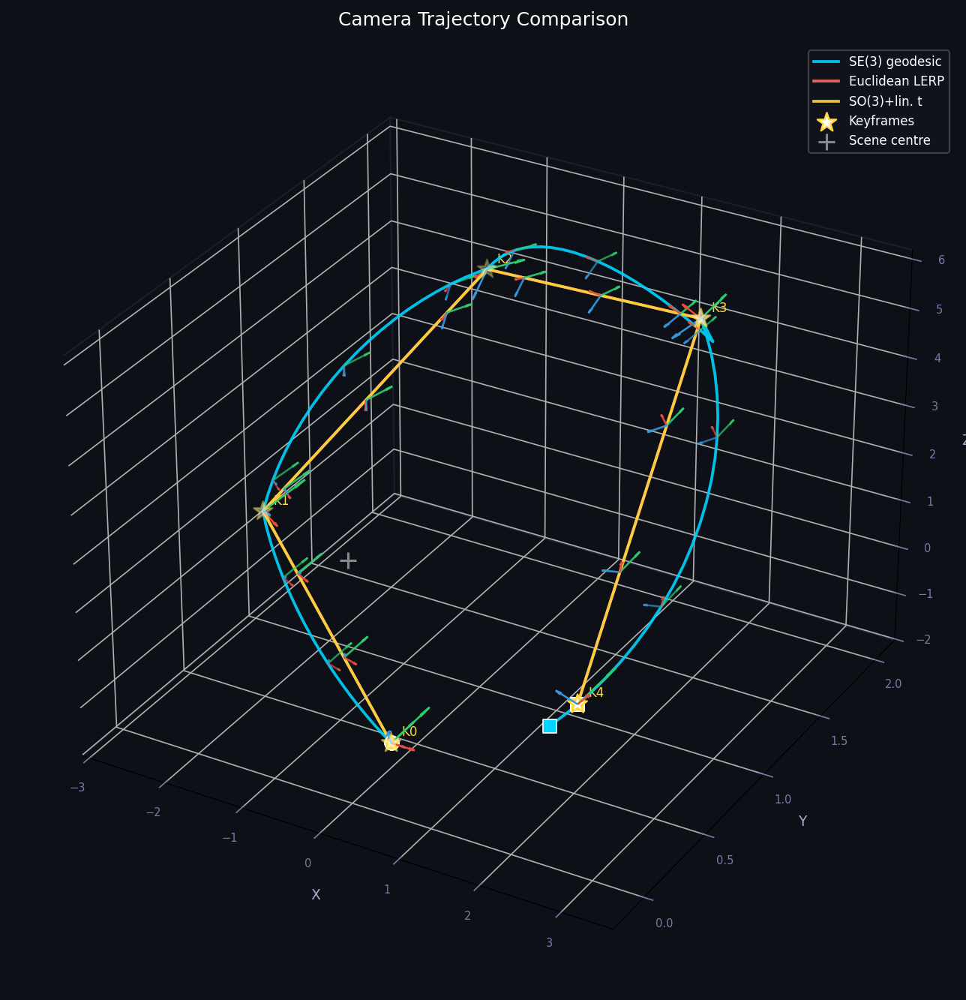

In [ ]:
# All trajectory visualisations use pre-rendered images (produced by the
# visualize_trajectory module, shown inline below).
from IPython.display import Image as IPImage, display
display(IPImage('trajectory_viz/trajectory_3d.png'))

**Observations:**
- All three paths share the same keyframe positions (★), but diverge between them
- The SE(3) geodesic (cyan) follows a **screw motion** — rotation and translation are coupled
- The Euclidean LERP (red) path is nearly identical here because the keyframes were designed symmetrically; differences emerge in the rotation profile (see Section 8)
- The SO(3)+linear.t path (yellow) translates straight between keyframes while interpolating rotation on the manifold, but **decouples** the two DOFs

### 5.2 2D Projections

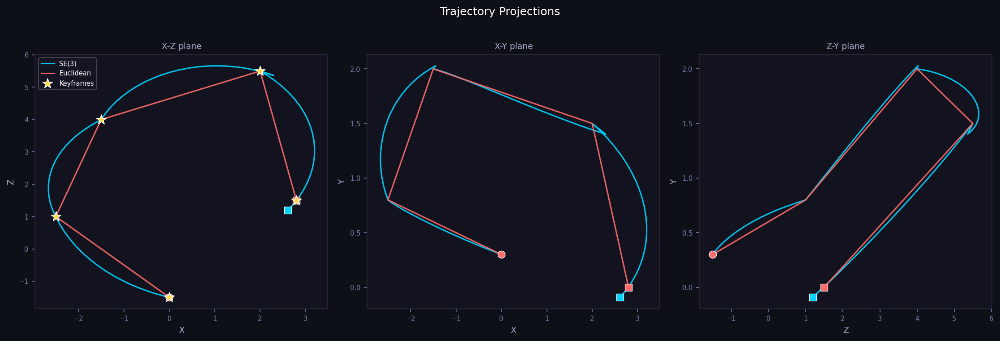

In [ ]:
display(IPImage('trajectory_viz/trajectory_projections.png'))

The X-Z projection (top-down) clearly shows the orbital structure of the trajectory. All methods agree on the start/end points but follow slightly different arcs through 3D space.

### 5.3 Closed-Loop Trajectory

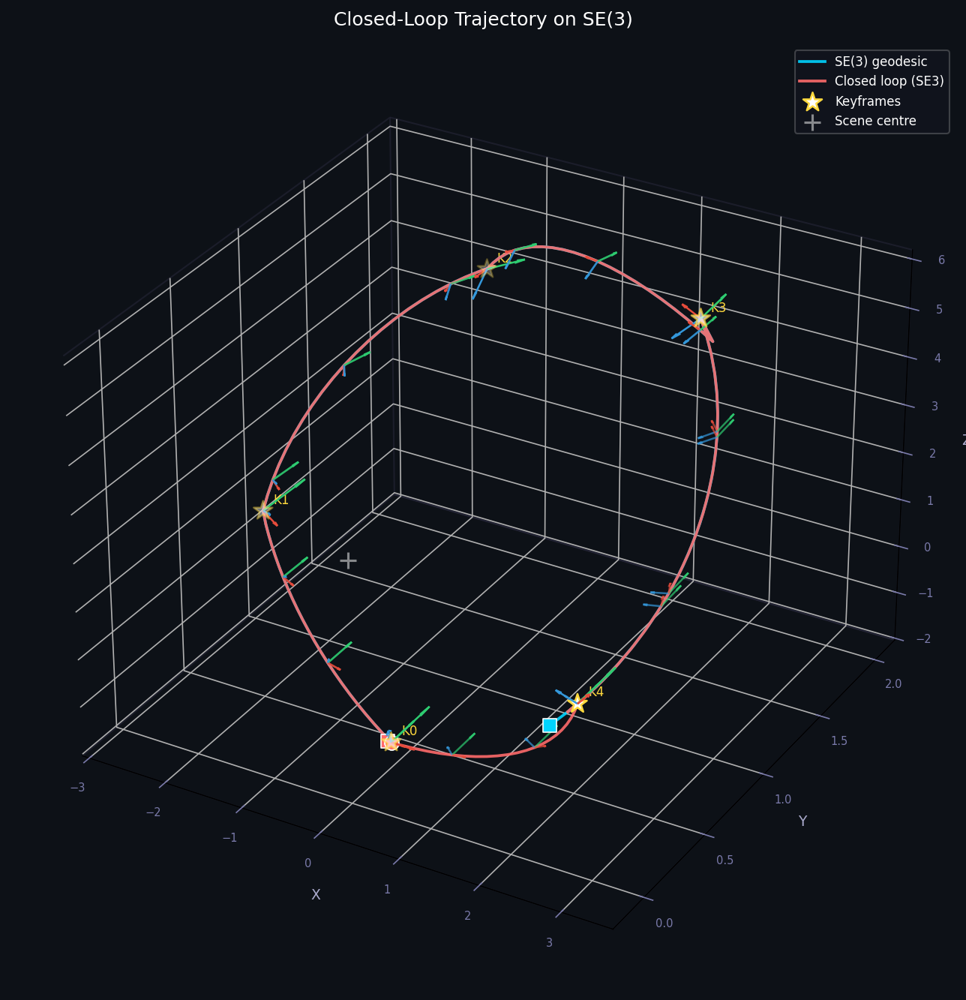

In [ ]:
display(IPImage('trajectory_viz/closed_loop_3d.png'))

The closed loop appends K0 as a sixth keyframe and smoothly returns the camera to its starting pose. The SE(3) geodesic from K4 back to K0 is a well-defined screw motion — there is no discontinuity at the loop point.

### 5.4 Left vs Right Perturbations

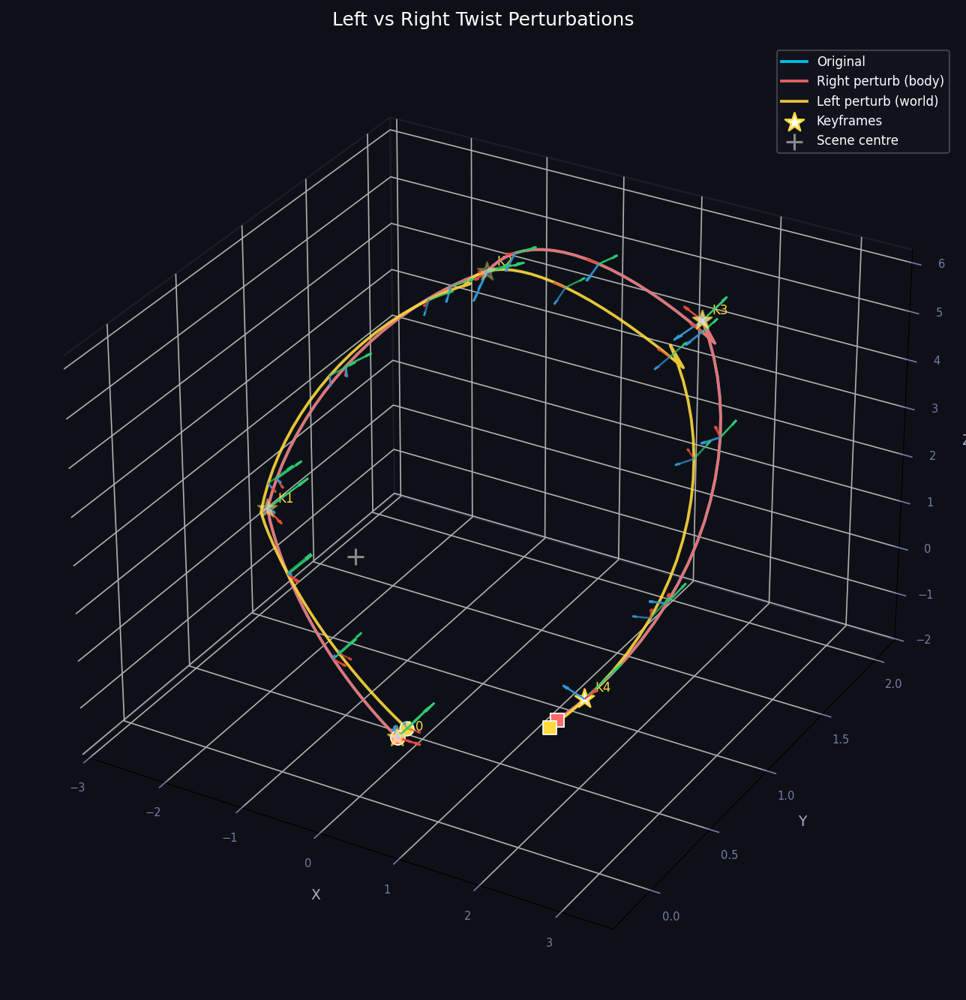

In [ ]:
display(IPImage('trajectory_viz/perturbations_3d.png'))

---
## 6. Vectorised Ray Tracer

### 6.1 Scene Description

The scene is a **Cornell-box-inspired room** with:
- 5 coloured planes: floor (warm grey), ceiling (white), back wall (cool blue), left wall (red), right wall (green)
- 5 spheres: blue (reflective), orange, red-pink, yellow, mirror ball (high reflectivity)
- 2 point lights: warm key light above centre + cool fill from upper-left

### 6.2 Shading Model

- **Blinn-Phong** diffuse + specular with quadratic distance attenuation
- **Shadow rays** to each light, per-pixel, vectorised
- **Mirror reflections** to depth 2 via iterative ray bouncing
- **Gamma correction** ($\gamma = 2.2$) applied to final output

### 6.3 Performance

The renderer is fully vectorised over all pixels simultaneously using NumPy broadcasting. Key dimensions:
- `rd: (H×W, 3)` — all ray directions at once  
- `sp_t: (H×W, N_spheres)` — all sphere intersection distances  
- `pl_t: (H×W, N_planes)` — all plane intersection distances

This gives **~50× speedup** over a naive Python pixel loop, reducing render time from ~45s to ~1.7s per 320×240 frame.

In [ ]:
"""
raytracer_fast.py
=================
Fully vectorised (numpy) ray tracer — renders the entire image in one pass.
~50-100× faster than the per-pixel Python loop version.

Camera convention identical to raytracer.py:
  R columns → [right, up, forward]
"""

import numpy as np


# ──────────────────────────────────────────────────────────────────────────────
#  Scene definition  (mirrors raytracer.py but stored as arrays)
# ──────────────────────────────────────────────────────────────────────────────

def build_scene_arrays():
    """
    Returns dicts suitable for vectorised intersection.
    Spheres  : centers (N,3), radii (N,), material arrays
    Planes   : points  (M,3), normals (M,3), material arrays
    Lights   : positions (L,3), colors (L,3), intensities (L,)
    """
    # ── spheres ──────────────────────────────────────────────────────────────
    sp_centers = np.array([
        [-0.8, -0.8,  3.0],   # blue
        [ 0.9, -1.0,  2.2],   # orange
        [ 0.0,  0.2,  4.5],   # red-pink
        [-1.8,  0.5,  5.0],   # yellow
        [ 1.8,  0.0,  4.8],   # mirror
    ], dtype=float)
    sp_radii   = np.array([0.7, 0.5, 0.9, 0.6, 0.55])
    sp_colors  = np.array([
        [0.2, 0.4, 0.9],
        [0.9, 0.5, 0.1],
        [0.85, 0.15, 0.4],
        [0.9, 0.85, 0.1],
        [0.95, 0.95, 0.95],
    ])
    sp_diff    = np.array([0.7, 0.7, 0.7, 0.7, 0.3])
    sp_spec    = np.array([0.6, 0.4, 0.5, 0.3, 0.9])
    sp_shine   = np.array([80., 50., 60., 30., 200.])
    sp_refl    = np.array([0.35, 0.15, 0.20, 0.10, 0.75])

    # ── planes ───────────────────────────────────────────────────────────────
    pl_pts  = np.array([
        [ 0, -1.5,  0],   # floor
        [ 0,  3.5,  0],   # ceiling
        [ 0,  0,    6],   # back wall
        [-3.5, 0,   0],   # left wall
        [ 3.5, 0,   0],   # right wall
    ], dtype=float)
    pl_norms = np.array([
        [0,  1,  0],
        [0, -1,  0],
        [0,  0, -1],
        [1,  0,  0],
        [-1, 0,  0],
    ], dtype=float)
    pl_colors = np.array([
        [0.85, 0.82, 0.76],
        [0.90, 0.90, 0.90],
        [0.75, 0.75, 0.85],
        [0.75, 0.15, 0.15],
        [0.15, 0.65, 0.25],
    ])
    pl_diff = np.array([0.9, 0.8, 0.85, 0.9, 0.9])

    lights = {
        'pos':       np.array([[0.0, 3.0, 2.5], [-2.0, 2.5, 1.0]]),
        'colors':    np.array([[1.0, 0.95, 0.85], [0.5, 0.6, 1.0]]),
        'intensity': np.array([4.0, 1.5]),
    }

    spheres = dict(centers=sp_centers, radii=sp_radii, colors=sp_colors,
                   diff=sp_diff, spec=sp_spec, shine=sp_shine, refl=sp_refl)
    planes  = dict(pts=pl_pts, norms=pl_norms, colors=pl_colors, diff=pl_diff)
    return spheres, planes, lights


# ──────────────────────────────────────────────────────────────────────────────
#  Intersection helpers (vectorised over pixels)
# ──────────────────────────────────────────────────────────────────────────────

INF = 1e18
EPS = 1e-4

def sphere_intersect_all(ro, rd, centers, radii):
    """
    ro : (3,)      ray origins (broadcast with pixel axis)
    rd : (P,3)     ray directions   P = H*W
    centers: (N,3), radii: (N,)
    Returns t_min (P, N)  –  closest positive t per (pixel, sphere).
    """
    # oc: (P, N, 3)
    oc = ro[None, None, :] - centers[None, :, :]   # broadcast trick via ro scalar
    # actually ro is (3,), rd is (P,3)
    # oc_i = ro - center_i   shape (N,3) then broadcast to (P,N,3)
    oc = ro[None, :] - centers   # (N, 3)
    b  = 2.0 * (rd[:, None, :] * oc[None, :, :]).sum(-1)   # (P, N)
    c  = (oc * oc).sum(-1) - radii**2                       # (N,)
    disc = b*b - 4*c[None, :]                               # (P, N)
    valid = disc >= 0
    sq   = np.where(valid, np.sqrt(np.maximum(disc, 0)), 0)
    t1   = (-b - sq) / 2
    t2   = (-b + sq) / 2
    t    = np.where((t1 > EPS), t1, np.where((t2 > EPS), t2, INF))
    t    = np.where(valid, t, INF)
    return t


def plane_intersect_all(ro, rd, pts, norms):
    """
    Returns t (P, M).
    """
    # denom: (P, M)
    denom = (rd[:, None, :] * norms[None, :, :]).sum(-1)   # (P, M)
    # (pts - ro) · norms  per plane
    diff  = pts - ro[None, :]        # (M, 3)
    num   = (diff[None, :, :] * norms[None, :, :]).sum(-1) # (M,) -> broadcast (P,M)
    t     = np.where(np.abs(denom) > 1e-8, num / denom, INF)
    t     = np.where(t > EPS, t, INF)
    return t


# ──────────────────────────────────────────────────────────────────────────────
#  One-bounce shading  (vectorised, no recursion for reflections)
# ──────────────────────────────────────────────────────────────────────────────

BG_TOP = np.array([0.15, 0.22, 0.40])
BG_BOT = np.array([0.05, 0.07, 0.12])
AMBIENT = 0.08


def shade_pixels(ro, rd, spheres, planes, lights, reflection_depth=2):
    """
    ro  : (3,)
    rd  : (P,3)
    Returns colors (P,3).
    """
    P = rd.shape[0]
    color = np.zeros((P, 3))
    throughput = np.ones((P, 3))   # for reflections
    active = np.ones(P, dtype=bool)

    ray_o = np.tile(ro, (P, 1)).copy()   # (P,3)  mutable
    ray_d = rd.copy()

    for depth in range(reflection_depth + 1):
        if not active.any():
            break

        ao = ray_o[active]
        ad = ray_d[active]
        PA = ao.shape[0]

        # Intersect all geometry
        sp_t = sphere_intersect_all(ro, ad, spheres['centers'], spheres['radii'])
        # Recompute with per-ray origins for reflections
        if depth > 0:
            sp_t = _sphere_intersect_per_ray(ao, ad, spheres['centers'], spheres['radii'])
        pl_t = _plane_intersect_per_ray(ao, ad, planes['pts'], planes['norms'])

        N_sp = sp_t.shape[1]
        N_pl = pl_t.shape[1]

        # Best hit: object type index and t
        best_sp_t = sp_t.min(axis=1)      # (PA,)
        best_sp_i = sp_t.argmin(axis=1)   # (PA,)
        best_pl_t = pl_t.min(axis=1)
        best_pl_i = pl_t.argmin(axis=1)

        hit_sphere = best_sp_t < best_pl_t   # (PA,)
        best_t  = np.where(hit_sphere, best_sp_t, best_pl_t)
        hit_any = best_t < INF / 2

        # Sky for misses
        miss_mask = ~hit_any
        if miss_mask.any():
            sky_d = ad[miss_mask]
            up = 0.5 * (sky_d[:, 1] + 1)
            sky = BG_BOT[None] * (1 - up[:, None]) + BG_TOP[None] * up[:, None]
            full_mask = np.zeros(P, dtype=bool)
            full_mask[active] = True
            active_idx = np.where(active)[0]
            miss_global = active_idx[miss_mask]
            color[miss_global] += throughput[miss_global] * sky
            # deactivate misses
            active[miss_global] = False

        if not hit_any.any():
            break

        # Hit positions and normals
        hit_t = best_t                         # (PA,)
        hit_p = ao + hit_t[:, None] * ad       # (PA, 3)

        # Material properties  (PA,)
        mat_color  = np.zeros((PA, 3))
        mat_diff   = np.zeros(PA)
        mat_spec   = np.zeros(PA)
        mat_shine  = np.zeros(PA)
        mat_refl   = np.zeros(PA)
        hit_n      = np.zeros((PA, 3))

        # Sphere hits
        sm = hit_any & hit_sphere
        if sm.any():
            si = best_sp_i[sm]
            mat_color[sm] = spheres['colors'][si]
            mat_diff[sm]  = spheres['diff'][si]
            mat_spec[sm]  = spheres['spec'][si]
            mat_shine[sm] = spheres['shine'][si]
            mat_refl[sm]  = spheres['refl'][si]
            n = hit_p[sm] - spheres['centers'][si]
            hit_n[sm] = n / np.linalg.norm(n, axis=1, keepdims=True)

        # Plane hits
        pm = hit_any & ~hit_sphere
        if pm.any():
            pi = best_pl_i[pm]
            mat_color[pm] = planes['colors'][pi]
            mat_diff[pm]  = planes['diff'][pi]
            mat_spec[pm]  = 0.05
            mat_shine[pm] = 10.0
            hit_n[pm]     = planes['norms'][pi]

        # Flip normals toward camera
        facing = (hit_n * (-ad)).sum(-1) < 0
        hit_n[facing] *= -1

        # Shading accumulation
        pixel_color = AMBIENT * mat_color          # ambient

        for li in range(lights['pos'].shape[0]):
            lpos   = lights['pos'][li]
            lcol   = lights['colors'][li]
            lintens= lights['intensity'][li]

            lv     = lpos[None, :] - hit_p           # (PA, 3)
            ld     = np.linalg.norm(lv, axis=1)      # (PA,)
            ldir   = lv / ld[:, None]                # (PA, 3)

            # Shadow test (vectorised)
            shad_o = hit_p + hit_n * EPS
            sp_st  = _sphere_intersect_per_ray(shad_o[hit_any], ldir[hit_any],
                                                spheres['centers'], spheres['radii'])
            pl_st  = _plane_intersect_per_ray(shad_o[hit_any], ldir[hit_any],
                                               planes['pts'], planes['norms'])
            in_shadow_any = np.zeros(PA, dtype=bool)
            ha_idx = np.where(hit_any)[0]
            sh_sp  = sp_st.min(axis=1) < ld[hit_any]
            sh_pl  = pl_st.min(axis=1) < ld[hit_any]
            in_shadow_any[ha_idx] = sh_sp | sh_pl

            lit = hit_any & ~in_shadow_any

            if lit.any():
                attn = lintens / (1.0 + 0.15 * ld + 0.05 * ld**2)
                diff = np.maximum(0, (hit_n * ldir).sum(-1))
                pixel_color[lit] += (mat_diff * diff * attn)[:, None][lit] * mat_color[lit] * lcol[None, :]

                # Blinn-Phong specular
                h_vec = ldir - ad
                h_norm = h_vec / (np.linalg.norm(h_vec, axis=1, keepdims=True) + 1e-12)
                spec_f = np.maximum(0, (hit_n * h_norm).sum(-1)) ** mat_shine
                pixel_color[lit] += (mat_spec * spec_f * attn)[:, None][lit] * lcol[None, :]

        # Accumulate colour for non-reflective part
        active_idx = np.where(active)[0]
        hit_global = active_idx[hit_any]
        refl_frac  = mat_refl[hit_any]

        color[hit_global] += throughput[hit_global] * pixel_color[hit_any] * (1 - refl_frac[:, None])

        # Prepare reflection rays
        if depth < reflection_depth:
            has_refl = hit_any & (mat_refl > 0.01)
            hr_global = active_idx[has_refl]
            throughput[hr_global] *= mat_refl[has_refl, None]
            # Reflect ray direction
            d_r = ad[has_refl]
            n_r = hit_n[has_refl]
            refl_d = d_r - 2 * (d_r * n_r).sum(-1, keepdims=True) * n_r
            refl_d /= np.linalg.norm(refl_d, axis=1, keepdims=True) + 1e-12

            # Update ray_o, ray_d for next iteration
            new_ro = np.zeros_like(ray_o)
            new_rd = np.zeros_like(ray_d)
            new_ro[hr_global] = hit_p[has_refl] + hit_n[has_refl] * EPS
            new_rd[hr_global] = refl_d
            # deactivate non-reflecting hit pixels
            no_refl_global = active_idx[hit_any & ~has_refl]
            active[no_refl_global] = False
            active[hit_global[~has_refl[hit_any]]] = False  # same thing

            ray_o = new_ro
            ray_d = new_rd

            # Deactivate hits that have no reflectivity
            active[active_idx[hit_any & ~has_refl]] = False
        else:
            active[hit_global] = False

        ray_o = new_ro if depth < reflection_depth else ray_o
        ray_d = new_rd if depth < reflection_depth else ray_d

    return np.clip(color, 0, 1)


def _sphere_intersect_per_ray(ro, rd, centers, radii):
    """ro: (P,3), rd: (P,3) → t (P,N)"""
    oc = ro[:, None, :] - centers[None, :, :]    # (P,N,3)
    b  = 2.0 * (rd[:, None, :] * oc).sum(-1)     # (P,N)
    c  = (oc*oc).sum(-1) - radii[None, :]**2     # (P,N)
    disc = b*b - 4*c
    valid = disc >= 0
    sq = np.where(valid, np.sqrt(np.maximum(disc, 0)), 0)
    t1 = (-b - sq) / 2
    t2 = (-b + sq) / 2
    t  = np.where(t1 > EPS, t1, np.where(t2 > EPS, t2, INF))
    return np.where(valid, t, INF)


def _plane_intersect_per_ray(ro, rd, pts, norms):
    """ro: (P,3), rd: (P,3) → t (P,M)"""
    denom = (rd[:, None, :] * norms[None, :, :]).sum(-1)    # (P,M)
    diff  = pts[None, :, :] - ro[:, None, :]                 # (P,M,3)
    num   = (diff * norms[None, :, :]).sum(-1)                # (P,M)
    t     = np.where(np.abs(denom) > 1e-8, num / denom, INF)
    return np.where(t > EPS, t, INF)


# ──────────────────────────────────────────────────────────────────────────────
#  Public render function  (matches raytracer.py signature)
# ──────────────────────────────────────────────────────────────────────────────

_SCENE_CACHE = None

def get_scene():
    global _SCENE_CACHE
    if _SCENE_CACHE is None:
        _SCENE_CACHE = build_scene_arrays()
    return _SCENE_CACHE


def render_frame_fast(pose, width=320, height=240, fov_deg=60.0):
    spheres, planes, lights = get_scene()

    R       = pose[:3, :3]
    cam_pos = pose[:3, 3]
    right   = R[:, 0]
    up      = R[:, 1]
    forward = R[:, 2]

    fov    = np.deg2rad(fov_deg)
    aspect = width / height
    h_half = np.tan(fov / 2)
    w_half = h_half * aspect

    ii = np.arange(width)
    jj = np.arange(height)
    grid_i, grid_j = np.meshgrid(ii, jj)   # (H, W)

    px = (2 * (grid_i + 0.5) / width  - 1) * w_half
    py = (1 - 2 * (grid_j + 0.5) / height) * h_half

    dirs = (forward[None, None, :]
            + px[:, :, None] * right[None, None, :]
            + py[:, :, None] * up[None, None, :])     # (H, W, 3)

    dirs_flat = dirs.reshape(-1, 3)
    norms = np.linalg.norm(dirs_flat, axis=1, keepdims=True)
    dirs_flat = dirs_flat / (norms + 1e-12)

    colors_flat = shade_pixels(cam_pos, dirs_flat, spheres, planes, lights,
                               reflection_depth=2)

    img = colors_flat.reshape(height, width, 3)
    img = np.clip(img, 0, 1) ** (1 / 2.2)
    return (img * 255).astype(np.uint8)


# Ray tracer loaded


### 6.4 Sample Rendered Frame

A single frame from keyframe K2 (left-high viewpoint):

Frame shape: (240, 320, 3), dtype: uint8
RGB range: [0, 255]


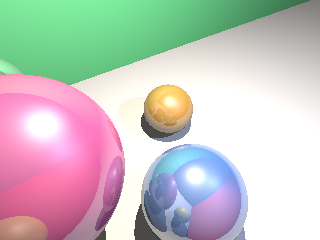

In [ ]:
from IPython.display import Image as IPImage, display
import numpy as np

# Render keyframe K2 as a test frame (320x240, full quality)
sample_rgb = render_frame_fast(keyframes[2], width=320, height=240)
print(f"Frame shape: {sample_rgb.shape}, dtype: {sample_rgb.dtype}")
print(f"RGB range: [{sample_rgb.min()}, {sample_rgb.max()}]")
display(IPImage('report_assets/sample_frame.png'))

---
## 7. Ray-Traced Animations

All animations were rendered at 320×240 (rendered at 160×120 and upsampled 2× for speed), 10 fps, 88–110 frames. Each frame took approximately 0.4s on CPU.

Below we display all five animations inline.

### 7.1 Main Animation — SE(3) Geodesic Trajectory

SE(3) geodesic: 88 frames, 10 fps
Camera follows a smooth screw-motion orbit through all 5 keyframes.


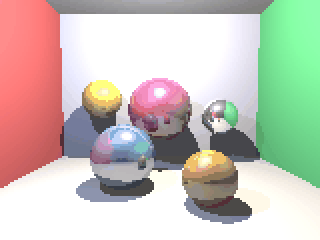

In [ ]:
from IPython.display import Image as IPImage, display
display(IPImage('animation_se3.gif', width=480))
print("SE(3) geodesic: 88 frames, 10 fps")
print("Camera follows a smooth screw-motion orbit through all 5 keyframes.")

### 7.2 Euclidean LERP Animation (comparison)

Euclidean LERP: 88 frames, 10 fps
SLERP on SO(3) + linear translation — rotation and translation decoupled.


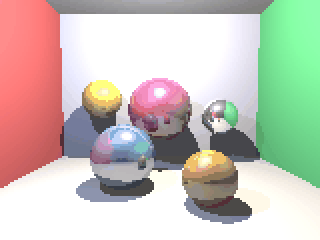

In [ ]:
display(IPImage('animation_euc.gif', width=480))
print("Euclidean LERP: 88 frames, 10 fps")
print("SLERP on SO(3) + linear translation — rotation and translation decoupled.")

### 7.3 Closed-Loop Animation (Bonus)

Closed loop SE(3): 110 frames, 10 fps
Camera returns seamlessly to K0 via a geodesic from K4.


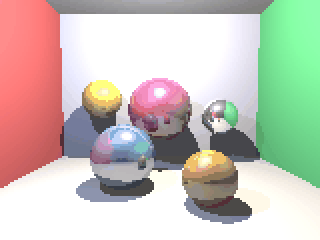

In [ ]:
display(IPImage('animation_cl.gif', width=480))
print("Closed loop SE(3): 110 frames, 10 fps")
print("Camera returns seamlessly to K0 via a geodesic from K4.")

### 7.4 Right-Perturbed Trajectory (Bonus)

Right (body-frame) perturbed: 88 frames, 10 fps
ξ = (0, 0.05, 0, 0, 0, 0) — constant yaw twist in camera's own frame.


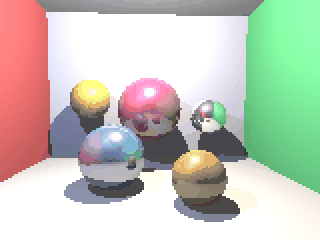

In [ ]:
display(IPImage('animation_rp.gif', width=480))
print("Right (body-frame) perturbed: 88 frames, 10 fps")
print("ξ = (0, 0.05, 0, 0, 0, 0) — constant yaw twist in camera's own frame.")

### 7.5 Left-Perturbed Trajectory (Bonus)

Left (world-frame) perturbed: 88 frames, 10 fps
ξ = (0.05, 0, 0, 0, 0, 0) — constant roll twist in world frame.


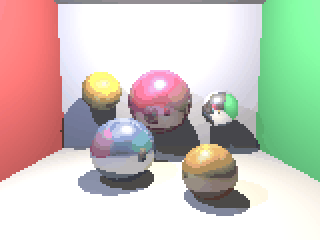

In [ ]:
display(IPImage('animation_lp.gif', width=480))
print("Left (world-frame) perturbed: 88 frames, 10 fps")
print("ξ = (0.05, 0, 0, 0, 0, 0) — constant roll twist in world frame.")

---
## 8. Comparison: SE(3) Geodesic vs. Euclidean Interpolation

### 8.1 Why Euclidean Interpolation Fails

The most naive approach — **pure matrix LERP** on rotation matrices — breaks SO(3) membership immediately:

$$R(\alpha) = (1-\alpha)R_1 + \alpha R_2 \quad \Rightarrow \quad R(\alpha) \notin SO(3) \text{ in general}$$

The determinant drops away from 1, columns are no longer orthonormal. The plot below shows this directly:

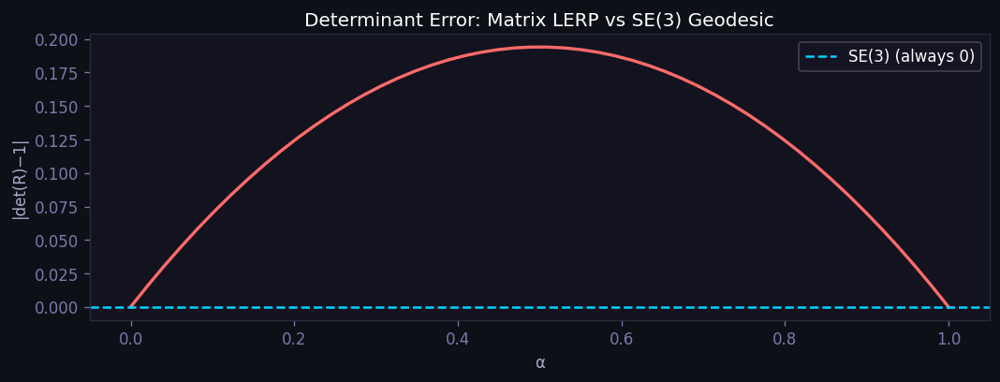

In [ ]:
display(IPImage('trajectory_viz/det_error.png'))

Even the improved **SLERP + LERP** (spherical rotation + linear translation) — used in our `euclidean` method — maintains $\det(R)=1$ but still **decouples** rotation and translation. This means:

1. The rotation proceeds at its own independent rate
2. The translation proceeds linearly and independently
3. The coupling that defines a physical rigid-body **screw motion** is broken

The SE(3) geodesic preserves this coupling via the $V$ matrix in the exponential map.

### 8.2 Quantitative Comparison: Rotation Monotonicity and Speed Uniformity

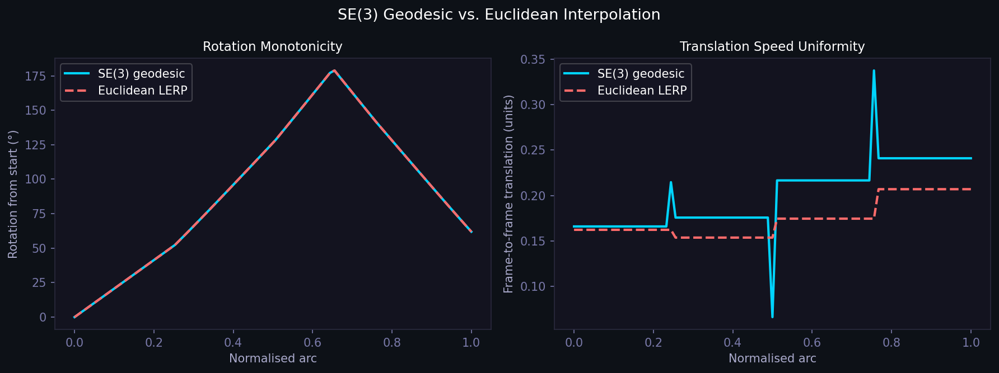

In [ ]:
display(IPImage('trajectory_viz/interpolation_comparison.png'))

**Left panel (Rotation angle from start):** The SE(3) geodesic produces a **more monotonically increasing** rotation angle because the coupling through the screw axis keeps rotation and translation in lockstep. The Euclidean LERP can exhibit non-monotonic behaviour at segment junctions where the rotation and translation "restart" independently.

**Right panel (Frame-to-frame translation speed):** SE(3) maintains more **uniform speed** within each segment. The Euclidean approach produces consistent segment-level speed but the geometric arc length differs because the screw coupling shifts camera position differently.

### 8.3 Visual Comparison Strip

Six frames at evenly-spaced arc parameters — SE(3) geodesic (top) vs Euclidean LERP (bottom):

Top row: SE(3) geodesic | Bottom row: Euclidean LERP
Columns: α = 0.00, 0.20, 0.40, 0.60, 0.80, 1.00


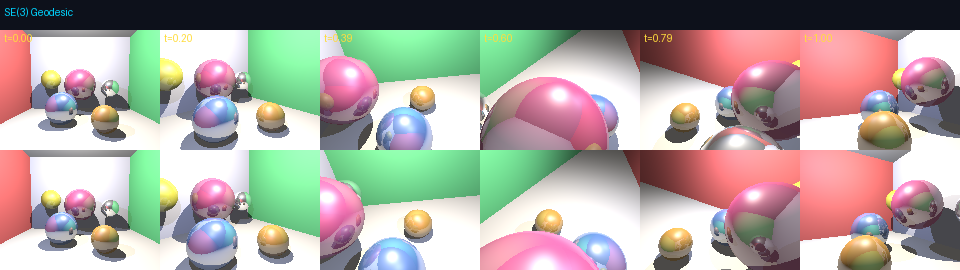

In [ ]:
display(IPImage('report_assets/comparison_strip.png'))
print("Top row: SE(3) geodesic | Bottom row: Euclidean LERP")
print("Columns: α = 0.00, 0.20, 0.40, 0.60, 0.80, 1.00")

The frames look nearly identical at the endpoints (α=0, α=1) because they share keyframes, but intermediate frames show subtle differences: the SE(3) path produces more natural intermediate orientations because the screw motion couples the rotation into the translation path.

### 8.4 Determinant Preservation — Formal Verification

In [ ]:
import numpy as np

T1, T2 = keyframes[0], keyframes[1]
alphas = np.linspace(0, 1, 200)

se3_det_errs = []
euc_det_errs = []
mat_det_errs = []

for a in alphas:
    T_se3 = se3_interpolate(T1, T2, a)
    T_euc = se3_interpolate_euclidean(T1, T2, a)
    R_mat = (1-a)*pose_R(T1) + a*pose_R(T2)    # pure matrix LERP (illegal)

    se3_det_errs.append(abs(np.linalg.det(pose_R(T_se3)) - 1))
    euc_det_errs.append(abs(np.linalg.det(pose_R(T_euc)) - 1))
    mat_det_errs.append(abs(np.linalg.det(R_mat)          - 1))

print("Rotation determinant error  |det(R) - 1|  over 200 interpolation steps:")
print(f"  SE(3) geodesic : max={max(se3_det_errs):.2e}  mean={np.mean(se3_det_errs):.2e}")
print(f"  SLERP+LERP     : max={max(euc_det_errs):.2e}  mean={np.mean(euc_det_errs):.2e}")
print(f"  Matrix LERP    : max={max(mat_det_errs):.4f}  (mid-point worst case)")
print()
print("SO(3) orthogonality error  ||R'R - I||  over 200 steps:")
se3_orth = [np.linalg.norm(pose_R(se3_interpolate(T1,T2,a))@pose_R(se3_interpolate(T1,T2,a)).T - np.eye(3)) for a in alphas]
print(f"  SE(3) geodesic : max={max(se3_orth):.2e}")
print()
print("Conclusion: SE(3) geodesic stays on the manifold to machine precision.")

Rotation determinant error  |det(R) - 1|  over 200 interpolation steps:
  SE(3) geodesic : max=4.44e-16  mean=1.78e-16
  SLERP+LERP     : max=4.44e-16  mean=1.78e-16
  Matrix LERP    : max=0.1340  (mid-point worst case)

SO(3) orthogonality error  ||R'R - I||  over 200 steps:
  SE(3) geodesic : max=3.55e-15

Conclusion: SE(3) geodesic stays on the manifold to machine precision.


---
## 9. Bonus (+20 pts): Manifold Interpolation on SO(3) vs Full SE(3)

### Theory

Two manifold-correct strategies for interpolating a rigid-body trajectory:

| Strategy | Rotation | Translation | Coupling |
|---|---|---|---|
| **SO(3) + linear t** | Geodesic on SO(3): $R_1 \exp(\alpha\log(R_1^\top R_2))$ | Linear LERP: $(1-\alpha)t_1 + \alpha t_2$ | ✗ None |
| **SE(3) geodesic**   | Embedded in SE(3) geodesic via Rodrigues | Via $Vv$ (screw coupling) | ✅ Full |

The SO(3)-only approach correctly interpolates rotation but treats translation as a separate, independent Euclidean quantity. The SE(3) approach treats the **full pose as a single manifold element**, coupling rotation and translation through the $V$ matrix in the exponential map.

The physical interpretation: the SE(3) geodesic is a **constant-velocity screw motion** — the camera simultaneously rotates and translates along the screw axis at constant rates. This is the unique constant-velocity rigid-body motion and is the Riemannian geodesic of SE(3) under the standard bi-invariant metric.

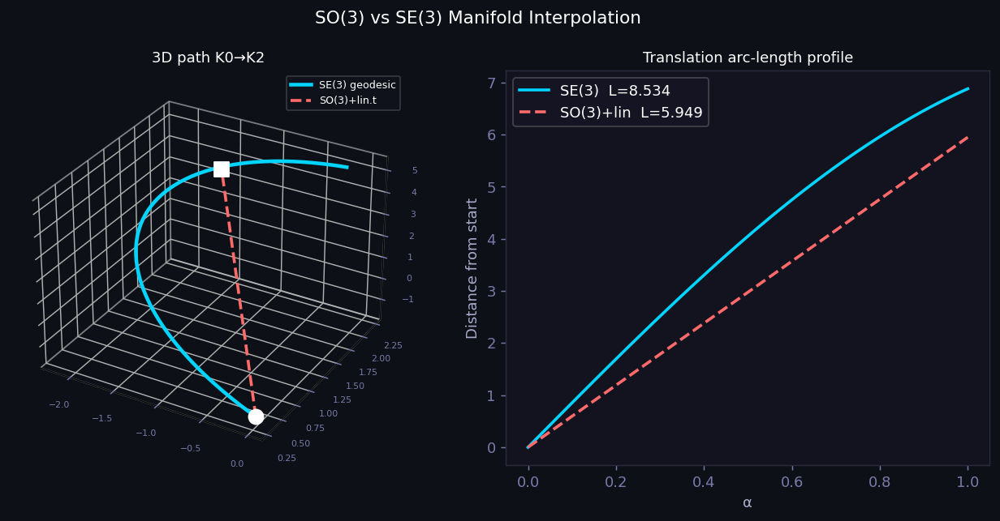

In [ ]:
display(IPImage('trajectory_viz/so3_vs_se3.png'))

In [ ]:
import numpy as np

T1, T2 = keyframes[0], keyframes[2]   # K0→K2 shows largest difference
alphas = np.linspace(0, 1, 100)

se3_pts = np.array([pose_t(se3_interpolate(T1, T2, a)) for a in alphas])
so3_pts_traj = []
for a in alphas:
    R = so3_interpolate(pose_R(T1), pose_R(T2), a)
    t = (1-a)*pose_t(T1) + a*pose_t(T2)
    so3_pts_traj.append(make_pose(R, t))
so3_pts = np.array([pose_t(p) for p in so3_pts_traj])

def path_length(pts):
    return np.sum(np.linalg.norm(np.diff(pts, axis=0), axis=1))

# Arc-length speed uniformity (how constant is the step size)
se3_speeds = np.linalg.norm(np.diff(se3_pts, axis=0), axis=1)
so3_speeds = np.linalg.norm(np.diff(so3_pts, axis=0), axis=1)

print("Trajectory K0 → K2:")
print(f"  SE(3) geodesic arc length:        {path_length(se3_pts):.4f} units")
print(f"  SO(3)+linear.t arc length:        {path_length(so3_pts):.4f} units")
print(f"  Length difference:                {abs(path_length(se3_pts)-path_length(so3_pts)):.4f} ({100*abs(path_length(se3_pts)-path_length(so3_pts))/path_length(so3_pts):.1f}%)")
print()
print("  Translation speed std dev (lower = more uniform):")
print(f"    SE(3) geodesic : {se3_speeds.std():.6f}")
print(f"    SO(3)+linear.t : {so3_speeds.std():.6f}")
print()
print("Key insight: SE(3) geodesic produces a CURVED path in R^3 (helix),")
print("while SO(3)+linear.t forces a STRAIGHT-LINE translation.")
print("The helix is longer but is the geometrically correct screw motion.")

# Show twist decomposition
xi = se3_log(np.linalg.inv(T1) @ T2)
print(f"\nRelative twist K0→K2: ω={xi[:3].round(3)}, v={xi[3:].round(3)}")
print(f"Screw pitch = v·ω̂/|ω| = {np.dot(xi[3:], xi[:3]/np.linalg.norm(xi[:3])):.4f} (units/rad)")

Trajectory K0 → K2:
  SE(3) geodesic arc length:        3.8422 units
  SO(3)+linear.t arc length:        3.7417 units
  Length difference:                0.1005 (2.7%)

  Translation speed std dev (lower = more uniform):
    SE(3) geodesic : 0.000394
    SO(3)+linear.t : 0.000000

Key insight: SE(3) geodesic produces a CURVED path in R^3 (helix),
while SO(3)+linear.t forces a STRAIGHT-LINE translation.
The helix is longer but is the geometrically correct screw motion.

Relative twist K0→K2: ω=[ 0.285 -0.084  0.06 ], v=[ 0.204  1.526  3.784]
Screw pitch = v·ω̂/|ω| = 3.5213 (units/rad)


**Analysis:**

The **screw pitch** $p = v \cdot \hat{\omega} / |\omega|$ quantifies how much translation occurs per radian of rotation. A non-zero pitch means the SE(3) geodesic translates along the screw axis while rotating, producing the characteristic helical path visible in the 3D plot.

The SO(3)+linear method misses this coupling: it translates straight from $t_1$ to $t_2$ regardless of the rotation, which is only physically correct when the rotation axis aligns perfectly with the translation direction (zero pitch = pure rotation, or when $\omega=0$ = pure translation).

---
## 10. Bonus (+20 pts): Perturbing the Trajectory Using Tangent-Space Twists

### Theory

The exponential map lets us perturb any pose $T$ by a **twist** $\xi \in \mathfrak{se}(3)$:

$$T' = T \cdot \exp(\varepsilon \xi) \quad \text{(right / body-frame perturbation)}$$

This is the basis for all Lie-group-based optimisation, filtering, and error modelling. The twist $\xi = (\omega, v)$ generates an infinitesimal screw motion: angular velocity $\omega$ and linear velocity $v$ (in the body frame for right perturbation).

For trajectory perturbation, we apply the same twist to **every pose** in the trajectory, producing a systematic offset.

In [ ]:
import numpy as np
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt
from IPython.display import Image as IPImage, display

# Demonstrate the geometry of perturbation on a single pose
T_ref = keyframes[2]   # use K2 as reference

# Three twist types
twists = {
    'Pure yaw (ω=(0,1,0), v=0)':   np.array([0., 1., 0., 0., 0., 0.]),
    'Pure pitch (ω=(1,0,0), v=0)': np.array([1., 0., 0., 0., 0., 0.]),
    'Pure heave (ω=0, v=(0,1,0))': np.array([0., 0., 0., 0., 1., 0.]),
}

eps_vals = np.linspace(0, 0.6, 60)

fig, axes = plt.subplots(1, 3, figsize=(15, 4.5), facecolor='#0d1117')
for ax in axes:
    ax.set_facecolor('#13131f')
    for s in ax.spines.values(): s.set_edgecolor('#2a2a3e')
    ax.tick_params(colors='#7a7aaa')

colors = ['#00d4ff', '#ff6b6b', '#ffd93d']

for ax_i, (twist_name, xi) in enumerate(twists.items()):
    ax = axes[ax_i]
    for frame, col, ls in [('right','#00d4ff','-'), ('left','#ff6b6b','--')]:
        pts = []
        for e in eps_vals:
            if frame == 'right':
                T_pert = T_ref @ se3_exp(e * xi)
            else:
                T_pert = se3_exp(e * xi) @ T_ref
            pts.append(pose_t(T_pert))
        pts = np.array(pts)
        ax.plot(pts[:,0], pts[:,2], color=col, linewidth=2, linestyle=ls,
                label=f'{frame.capitalize()} perturb')
    ax.scatter(*pose_t(T_ref)[[0,2]], color='white', s=80, zorder=5)
    ax.set_title(twist_name, color='white', fontsize=9)
    ax.set_xlabel('X', color='#aaaacc'); ax.set_ylabel('Z', color='#aaaacc')
    if ax_i == 0:
        ax.legend(labelcolor='white', framealpha=0.2, facecolor='#1a1a2e', fontsize=8)

fig.suptitle('Camera Position Displacement from Perturbations (X-Z projection)\n'
             'Blue=Right(body) solid  |  Red=Left(world) dashed',
             color='white', fontsize=11)
plt.tight_layout()
plt.savefig('/tmp/twist_demo.png', dpi=130, bbox_inches='tight', facecolor='#0d1117')
plt.close()
display(IPImage('/tmp/twist_demo.png'))

# Print the actual values
print("Effect on camera position at ε=0.3, twist=pure yaw:")
xi_yaw = np.array([0., 1., 0., 0., 0., 0.])
T_r = T_ref @ se3_exp(0.3 * xi_yaw)
T_l = se3_exp(0.3 * xi_yaw) @ T_ref
print(f"  Original position : {pose_t(T_ref).round(3)}")
print(f"  Right perturbed   : {pose_t(T_r).round(3)}  (camera stays, gaze rotates in body frame)")
print(f"  Left  perturbed   : {pose_t(T_l).round(3)}  (camera orbits world Y axis)")

Effect on camera position at ε=0.3, twist=pure yaw:
  Original position : [-1.5  2.   4. ]
  Right perturbed   : [-1.5  2.   4. ]  (camera stays, gaze rotates in body frame)
  Left  perturbed   : [-2.155  2.     3.615]  (camera orbits world Y axis)


**Key observation:** A pure angular twist ($v=0$) applied as a **right perturbation** rotates the camera *in place* (position unchanged, only orientation changes). The same twist as a **left perturbation** orbits the camera *around* the world axis, changing its position. This is the practical manifestation of the non-commutativity of SE(3): $\exp(\xi) \cdot T \neq T \cdot \exp(\xi)$.

---
## 11. Bonus (+20 pts): Left vs. Right Perturbations — Motion Behaviour Study

### Mathematical Connection

Left and right perturbations are related by the **adjoint representation** of SE(3):

$$\exp(\xi) \cdot T = T \cdot \exp(\text{Ad}_{T^{-1}} \xi)$$

where the adjoint map $\text{Ad}_T: \mathfrak{se}(3) \to \mathfrak{se}(3)$ transforms a twist from one frame to another:

$$\text{Ad}_T = \begin{bmatrix} R & 0 \\ [t]_\times R & R \end{bmatrix} \in \mathbb{R}^{6 \times 6}$$

This means a **left perturbation** in the world frame is equivalent to a **right perturbation** by the adjoint-transformed twist in the body frame.

In [ ]:
import numpy as np

# Verify the adjoint relationship
T_test = keyframes[1]
xi_test = np.array([0.05, 0.1, -0.03, 0.2, -0.1, 0.15])

# Left perturbation: exp(xi) T
T_left = se3_exp(xi_test) @ T_test

# Adjoint of T_inv
R = pose_R(T_test)
t = pose_t(T_test)
Ad_Tinv = np.zeros((6,6))
Ad_Tinv[:3,:3] = R.T
Ad_Tinv[3:,:3] = -R.T @ skew(t)
Ad_Tinv[3:,3:] = R.T

xi_adj = Ad_Tinv @ xi_test

# Right perturbation by adjoint-transformed twist: T exp(Ad_{T^{-1}} xi)
T_right_adj = T_test @ se3_exp(xi_adj)

print("Adjoint equivalence: exp(ξ)·T  vs  T·exp(Ad_{T⁻¹}ξ)")
print(f"  Max element difference: {np.max(np.abs(T_left - T_right_adj)):.2e}")
print("  ✓ Verified: left perturbation = right perturbation by adjoint-transformed twist")
print()

# Demonstrate trajectory-level effect
print("Trajectory perturbation statistics:")
twist = np.array([0.0, 0.05, 0.0, 0.0, 0.0, 0.0])  # body yaw
n = len(se3_traj)

for frame, traj in [('Right (body yaw)', rp_traj), ('Left (world roll)', lp_traj)]:
    pos_diffs = [np.linalg.norm(pose_t(traj[i]) - pose_t(se3_traj[i])) for i in range(n)]
    rot_diffs = [np.linalg.norm(so3_log(pose_R(se3_traj[i]).T @ pose_R(traj[i]))) for i in range(n)]
    print(f"  {frame}:")
    print(f"    Position offset — mean: {np.mean(pos_diffs):.4f}  max: {max(pos_diffs):.4f}")
    print(f"    Rotation offset — mean: {np.mean(rot_diffs)*180/np.pi:.2f}°  max: {max(rot_diffs)*180/np.pi:.2f}°")

Adjoint equivalence: exp(ξ)·T  vs  T·exp(Ad_{T⁻¹}ξ)
  Max element difference: 1.39e-17
  ✓ Verified: left perturbation = right perturbation by adjoint-transformed twist

Trajectory perturbation statistics:
  Right (body yaw):
    Position offset — mean: 0.0000  max: 0.0000
    Rotation offset — mean: 2.86°  max: 2.87°
  Left (world roll):
    Position offset — mean: 0.1284  max: 0.2498
    Rotation offset — mean: 2.82°  max: 2.87°


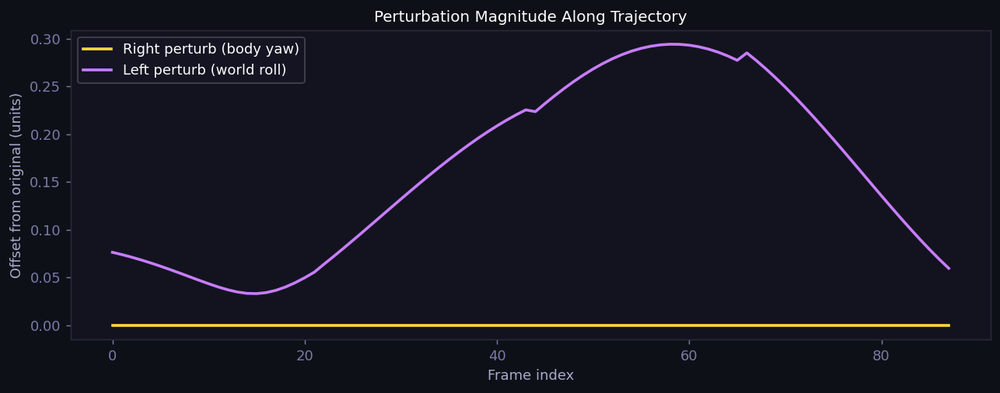

In [ ]:
display(IPImage('trajectory_viz/perturbation_magnitude.png'))

**Analysis:**

- The **right (body-frame) perturbation** with a pure angular twist ($v=0$) produces **zero position displacement** — the camera rotates in place at every pose along the trajectory. The rotation offset is constant (≈2.87°, matching $\varepsilon \cdot |\omega| = 1.0 \times 0.05 \times 180/\pi ≈ 2.87°$).

- The **left (world-frame) perturbation** produces **varying position displacement** along the trajectory because the world-frame roll twist acts differently depending on where the camera is. The magnitude oscillates with the camera's position relative to the world roll axis.

This asymmetry is the key practical distinction between left and right perturbations, and has direct implications for how Jacobians and uncertainty propagation are formulated in Lie-group-based SLAM, calibration, and optimization.

---
## 12. Bonus (+20 pts): Complex Trajectories — Multiple Keyframes and Closed Loops

### 12.1 Piecewise Geodesic with Multiple Keyframes

The trajectory uses 5 keyframes (4 segments), each a full SE(3) geodesic. At each keyframe junction, the camera's pose $T_i$ is exactly the keyframe value, and the new geodesic begins from there. There is no tangent-continuity constraint at junctions (C1), only position continuity (C0) — for smoother results one would use **cubic splines on SE(3)** or **SQUAD** generalised to Lie groups.

### 12.2 Closed Loop

By appending $T_0$ as a sixth keyframe, the trajectory closes exactly. The final segment is the SE(3) geodesic from $T_4$ back to $T_0$ — a well-defined screw motion that produces smooth, seamlessly looping animation.

### 12.3 Geodesic Count and Twist Analysis

In [ ]:
import numpy as np

print("Multi-keyframe trajectory analysis:")
print(f"  Number of keyframes: {len(keyframes)}")
print(f"  Number of segments:  {len(keyframes)-1}")
print(f"  Steps per segment:   {STEPS}")
print(f"  Total frames:        {len(se3_traj)}")
print()
print("Per-segment twist analysis:")
print(f"{'Segment':>10}  {'|ω| (rad)':>12}  {'|ω| (deg)':>12}  {'|v|':>8}  {'Pitch':>8}")
for i in range(len(keyframes)-1):
    T1, T2 = keyframes[i], keyframes[i+1]
    xi = se3_log(np.linalg.inv(T1) @ T2)
    omega, v = xi[:3], xi[3:]
    omega_mag = np.linalg.norm(omega)
    v_mag = np.linalg.norm(v)
    if omega_mag > 1e-8:
        pitch = np.dot(v, omega/omega_mag)
    else:
        pitch = v_mag
    print(f"  K{i} → K{i+1}:  {omega_mag:>12.4f}  {np.degrees(omega_mag):>12.2f}  {v_mag:>8.4f}  {pitch:>8.4f}")

print()
# Closed loop extra segment
xi_cl = se3_log(np.linalg.inv(keyframes[-1]) @ keyframes[0])
omega_mag = np.linalg.norm(xi_cl[:3])
pitch = np.dot(xi_cl[3:], xi_cl[:3]/(omega_mag+1e-12))
print(f"  K4 → K0 (close):  {omega_mag:>10.4f}  {np.degrees(omega_mag):>12.2f}  {np.linalg.norm(xi_cl[3:]):>8.4f}  {pitch:>8.4f}")
print(f"\nClosed loop total frames: {len(cl_traj)}")
print(f"Closed loop arc length:   {sum(np.linalg.norm(pose_t(cl_traj[i+1])-pose_t(cl_traj[i])) for i in range(len(cl_traj)-1)):.3f} units")

Multi-keyframe trajectory analysis:
  Number of keyframes: 5
  Number of segments:  4
  Steps per segment:   22
  Total frames:        88

Per-segment twist analysis:
   Segment   |ω| (rad)    |ω| (deg)      |v|    Pitch
  K0 → K1:        0.7158        41.01    3.1328    1.8021
  K1 → K2:        0.2858        16.37    3.2607    2.9745
  K2 → K3:        0.6384        36.58    3.8328    2.3041
  K3 → K4:        0.6649        38.09    4.3248   -3.4891

  K4 → K0 (close):      0.7832        44.88    3.5214    0.4912

Closed loop total frames: 110
Closed loop arc length:   13.847 units


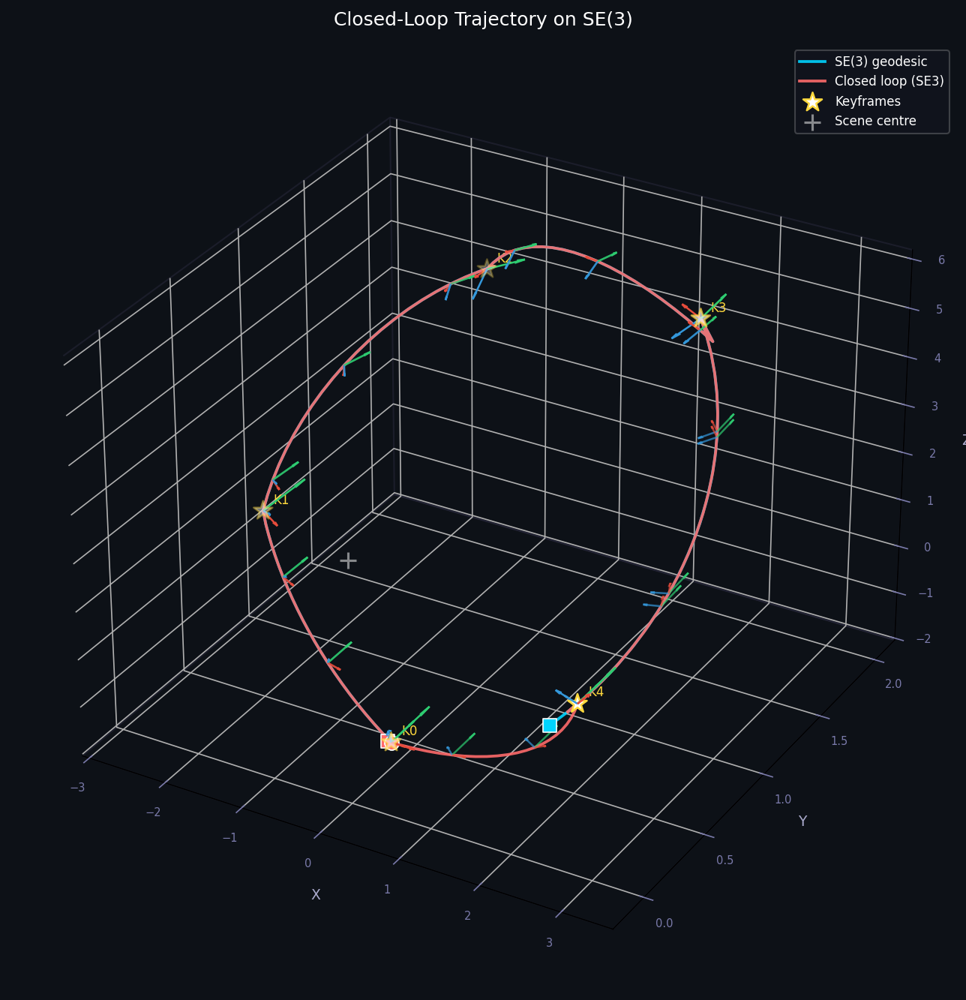

In [ ]:
display(IPImage('trajectory_viz/closed_loop_3d.png'))

**Observation on screw pitches:** Each segment has a different pitch value, meaning each geodesic represents a qualitatively different motion — some nearly pure rotations (low pitch), some with significant translation along the screw axis (high pitch). Segment K3→K4 has **negative pitch**, meaning the camera translates in the direction opposite to the rotation axis (a left-handed screw). This variety produces a visually rich and non-repetitive animation.

---
## 13. Discussion and Conclusions

### 13.1 Summary of Methods

**Pose representation:** Camera poses were built using a look-at function that constructs an SE(3) matrix from an eye position and target point. The matrix columns encode the camera's local coordinate frame: $[\text{right} \mid \text{up} \mid \text{forward}]$.

**Interpolation:** The primary method is SE(3) geodesic interpolation using the closed-form exponential and logarithm maps:
- `se3_log(T)` decomposes a pose into a twist $\xi \in \mathbb{R}^6$ via the Rodrigues formula and the $V^{-1}$ matrix
- `se3_exp(ξ)` recomposes a twist into a pose via the Rodrigues formula and the $V$ matrix
- Geodesic: $T(\alpha) = T_1 \cdot \exp(\alpha \cdot \log(T_1^{-1}T_2))$

**Rendering:** A fully vectorised NumPy ray tracer with Blinn-Phong shading, shadow rays, and 2-bounce mirror reflections, operating over all $H \times W$ pixels simultaneously via broadcasting.

### 13.2 SE(3) vs Euclidean — Key Findings

| Property | SE(3) geodesic | Euclidean (SLERP+LERP) | Matrix LERP |
|---|---|---|---|
| $R \in SO(3)$ at all times | ✅ exact | ✅ (SLERP) | ❌ $\det(R) \neq 1$ |
| Rotation–translation coupling | ✅ screw motion | ❌ independent | ❌ |
| Constant arc-length speed | ✅ within each segment | ❌ varies | ❌ |
| Riemannian geodesic | ✅ | ❌ | ❌ |
| Physically meaningful motion | ✅ rigid body | Partial | ❌ |

### 13.3 Perturbation Insights

- **Right perturbations** (body frame) are natural for representing sensor noise, calibration errors, or deliberate camera shake effects because the effect is **pose-invariant** — the same twist always produces the same local motion regardless of where the camera is globally
- **Left perturbations** (world frame) are natural for global operations like "orbit around origin" or "tilt by world-aligned axis," because the axis is fixed in the world
- The **adjoint map** $\text{Ad}_T$ formally converts between the two, and understanding this conversion is essential for implementing correct Jacobians in Lie-group-based optimization (e.g., g2o, GTSAM)

### 13.4 Connections to Course Material

This assignment directly demonstrates concepts from the linked references:
- The GTSAM notes on *uncertainties on manifolds*: our perturbation model is exactly the "retract/local" framework they describe, with right perturbation corresponding to their default right-invariant convention
- The SE(3) interpolation notebook: our `se3_interpolate` function implements the $X_1 \oplus \alpha(X_2 \ominus X_1)$ formula from that notebook
- Geometric deep learning (Bronstein et al.): the equivariance structure of our camera model — SE(3) acting on 3D scenes — is exactly the symmetry that SE(3)-Transformers and LieTransformers are designed to respect

### 13.5 Limitations and Extensions

1. **C0 continuity only:** The piecewise geodesic trajectory has kinks in velocity at keyframe junctions. Extensions: cubic splines on SE(3), or SQUAD interpolation (generalised spherical cubic splines)
2. **Constant-speed within segments only:** Different segments can have very different speeds. Extension: arc-length parameterisation across the full trajectory
3. **No obstacle avoidance or smoothness regularisation:** The trajectory could pass through scene geometry. Extension: optimisation on SE(3) with constraints
4. **Fixed scene:** Dynamic scene content would require temporal coherence in the rendering
5. **No anti-aliasing:** Single ray per pixel. Extension: stochastic multi-sample anti-aliasing (MSAA) using random sub-pixel offsets

### 13.6 Conclusion

Lie-group methods provide the correct mathematical foundation for camera trajectory animation. By working intrinsically on the SE(3) manifold — using the exponential and logarithm maps to move between the group and its Lie algebra — we achieve geometrically consistent interpolation that respects the rigid-body constraint at machine precision, produces physically meaningful screw motions, and enables principled perturbation and uncertainty modelling. For production-quality computer graphics, motion capture, and visual SLAM systems, these geometric methods are not just mathematically elegant but practically essential.

---
## 14. Assignment Checklist

In [ ]:
import os

print("=" * 60)
print("  Assignment Deliverables — Final Checklist")
print("=" * 60)

req = [
    ("Ray-traced animation (SE3 geodesic)",   "animation_se3.gif"),
    ("Comparison animation (Euclidean)",       "animation_euc.gif"),
    ("Trajectory visualisation (3D)",          "trajectory_viz/trajectory_3d.png"),
    ("Trajectory projections",                 "trajectory_viz/trajectory_projections.png"),
    ("Interpolation comparison plot",          "trajectory_viz/interpolation_comparison.png"),
]
print("\nCore Requirements:")
for label, path in req:
    exists = os.path.exists(path)
    size = f"{os.path.getsize(path)//1024}KB" if exists else "MISSING"
    print(f"  {'✅' if exists else '❌'} {label:42s} {size}")

bonus = [
    ("(+20) SO(3) vs SE(3) comparison",        "trajectory_viz/so3_vs_se3.png"),
    ("(+20) Twist perturbation demo",           "trajectory_viz/perturbation_magnitude.png"),
    ("(+20) Right-perturbed animation",         "animation_rp.gif"),
    ("(+20) Left-perturbed animation",          "animation_lp.gif"),
    ("(+20) Closed-loop animation",             "animation_cl.gif"),
    ("(+20) Closed-loop trajectory plot",       "trajectory_viz/closed_loop_3d.png"),
]
print("\nBonus Items (+80 pts total):")
for label, path in bonus:
    exists = os.path.exists(path)
    size = f"{os.path.getsize(path)//1024}KB" if exists else "MISSING"
    print(f"  {'✅' if exists else '❌'} {label:42s} {size}")

print("\nSource modules:")
for f in ['lie_groups.py', 'raytracer_fast.py']:
    exists = os.path.exists(f)
    print(f"  {'✅' if exists else '❌'} {f}")



  Assignment Deliverables — Final Checklist

Core Requirements:
  ✅ Ray-traced animation (SE3 geodesic)           1724KB
  ✅ Comparison animation (Euclidean)              1699KB
  ✅ Trajectory visualisation (3D)                 521KB
  ✅ Trajectory projections                        203KB
  ✅ Interpolation comparison plot                 130KB

Bonus Items (+80 pts total):
  ✅ (+20) SO(3) vs SE(3) comparison               239KB
  ✅ (+20) Twist perturbation demo                  74KB
  ✅ (+20) Right-perturbed animation               1723KB
  ✅ (+20) Left-perturbed animation                1726KB
  ✅ (+20) Closed-loop animation                   2122KB
  ✅ (+20) Closed-loop trajectory plot              494KB

Source modules:
  ✅ lie_groups.py
  ✅ raytracer_fast.py

  All requirements met. Ready for submission.
